<a href="https://colab.research.google.com/github/julianVelandia/NotebookPredictGarbageByType/blob/master/NotebookPredictGarbageByType.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Clasificador de basura con redes neuronales**

***

###Universidad Nacional de Colombia 

- Julián Camilo Velandia
- María Alejandra Rojas
- Nikolai Alexander Caceres


**Descargar el dataset**

Ir a la web del [DataSet en Kaggle](https://www.kaggle.com/datasets/arkadiyhacks/drinking-waste-classification) y descargarlo.
Este DataSet del usuario **ARKADIY SEREZHKIN** y cuenta con imágenes de 4 clasificaciones de basura tomadas a la misma distancia y en condiciones similares de iluminación

<img width="180" alt="image" src="https://user-images.githubusercontent.com/52173621/204308465-77b1fe2f-fb8b-4d70-8b5f-62ae86143b29.png">


Extrae las carpetas del archivo .zip y crea 2 carpetas .zip de las direcciones
archive/Images_of_Waste/rawimgs/AluCan y archive/Images_of_Waste/rawimgs/PET

<img width="547" alt="image" src="https://user-images.githubusercontent.com/52173621/204309667-ce071c19-200b-41bd-bb6f-d00ca97dc710.png">

Mover las carpetas PET.zip y AluCan.zip al espacio de trabajo.
El espacio de trabajo se debería ver así

<img width="179" alt="image" src="https://user-images.githubusercontent.com/52173621/204314465-e2f7c278-e20f-4c1b-95bb-ff1e24f3db15.png">

Debe asegurarse que el proceso se complete

<img width="252" alt="image" src="https://user-images.githubusercontent.com/52173621/204309890-0f8d9bf9-5fd9-4b34-a4a9-b20b095a19f5.png">

Luego se descomprimen los .zip en la sesión de Colab


In [2]:
!unzip -q /content/PET.zip -d /content/
!unzip -q /content/AluCan.zip -d /content/

replace /content/PET/PET1,000.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/PET/PET1,001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
replace /content/AluCan/AluCan1,000.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [3]:
import os

metal = os.listdir('/content/AluCan')
plastic = os.listdir('/content/PET')

/content/AluCan/AluCan63.jpg


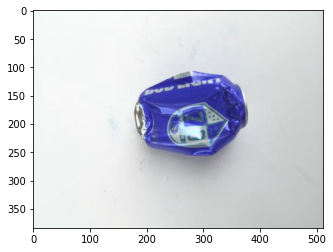

In [6]:
import matplotlib.pyplot as plt
import cv2

path = "/content/AluCan/"+metal[10]
img = cv2.imread(path)
print(path)
plt.imshow(img)

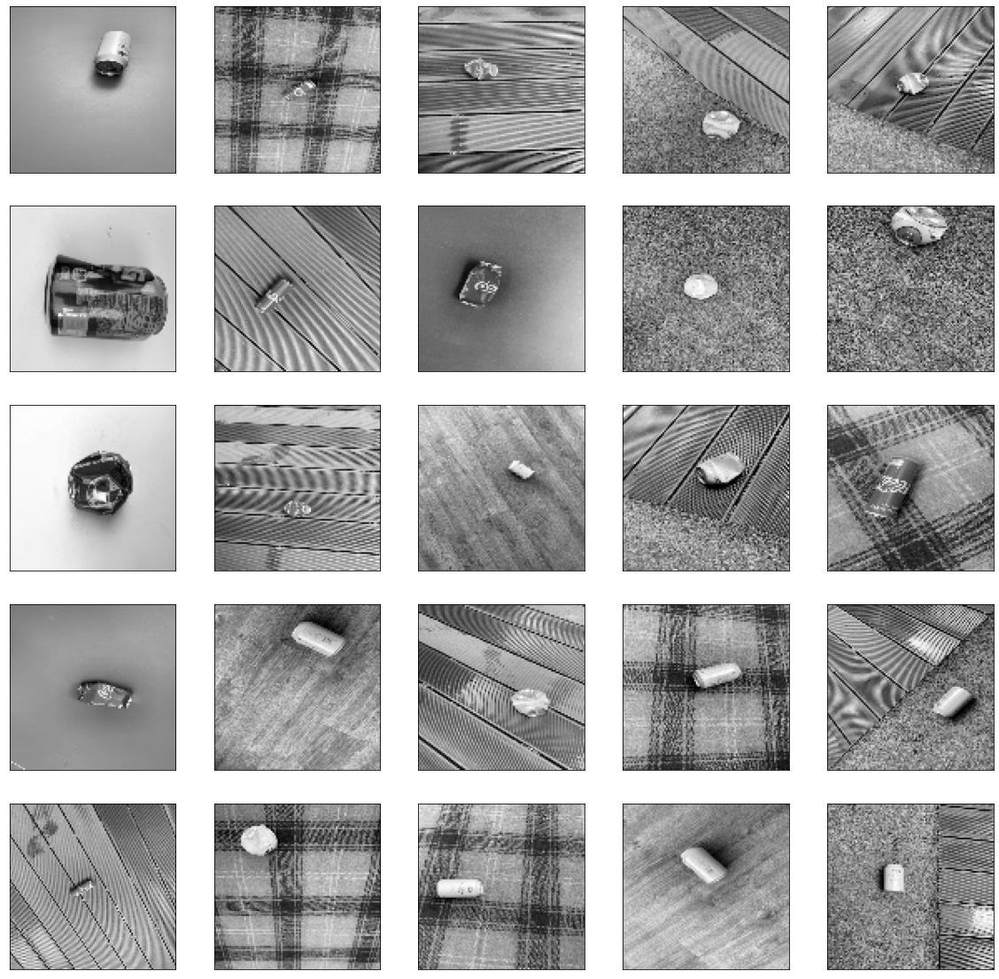

In [8]:
plt.figure(figsize=(20,20))

TAMANO_IMG=100

i=0
for img_path in metal:
  path = "/content/AluCan/"+img_path
  img = cv2.imread(path)
  imagen = cv2.resize(img, (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.yticks([])
  plt.xticks([])
  plt.imshow(imagen, cmap='gray')
  i+=1
  if i == 25:
    break

Se cambia el tamano a 100,100,1

In [9]:
datos_entrenamiento = []

for  img_path in metal:
  path = "/content/AluCan/"+img_path
  img = cv2.imread(path)
  imagen = cv2.resize(img, (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)
  datos_entrenamiento.append([imagen, 0])

for  img_path in plastic:
  path = "/content/PET/"+img_path
  img = cv2.imread(path)
  imagen = cv2.resize(img, (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)
  datos_entrenamiento.append([imagen, 1])

In [10]:
len(datos_entrenamiento)

2568

In [11]:
X = []
y = []

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [12]:
import numpy as np

X = np.array(X).astype(float) / 255

In [13]:
y = np.array(y)

In [14]:
import tensorflow as tf

***Red neuronal multicapa***
***

Esta red cuenta con una entrada de 10000 pixeles (100 por 100), 2 capas densas de 150 neuronas cada una y una capa de salida con las 2 opciones (clasificada como metálica o plástica).

![image](https://user-images.githubusercontent.com/52173621/204068045-84e46e9c-b627-4e90-9267-ef0f6c6b1b3c.png)


In [15]:
modeloDenso = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

***Red neuronal convolucional***
***
Está red cuenta con 3 pares de capas convolucionales y de agrupación máxima que cuenta con 32, 64 y 128 filtros respectivamente y una capa densa de 100 neuronas y la salida igual que en la primera red.


In [16]:
modeloCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

***Red neuronal convolucional con DropOut***
***
Se usa el DropOut para apagar aleatoriamente algunas neuronas, para esto se usa la misma red neuronal convolucional.

In [17]:
modeloCNN2 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

Para todas las redes se utilizó el optimizador Adam y una función de pérdida binary cross entropy (Por lo que se tiene una salida binaria)

In [18]:
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [19]:
modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [20]:
modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [21]:
from tensorflow.keras.callbacks import TensorBoard

In [22]:
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloDenso.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
69/69 [==============================] - 3s 8ms/step - loss: 0.9286 - accuracy: 0.5096 - val_loss: 0.8843 - val_accuracy: 0.2461
Epoch 2/100
69/69 [==============================] - 0s 5ms/step - loss: 0.6784 - accuracy: 0.5995 - val_loss: 0.8677 - val_accuracy: 0.2927
Epoch 3/100
69/69 [==============================] - 0s 5ms/step - loss: 0.6899 - accuracy: 0.5852 - val_loss: 0.9760 - val_accuracy: 0.0829
Epoch 4/100
69/69 [==============================] - 0s 4ms/step - loss: 0.6647 - accuracy: 0.6040 - val_loss: 1.0127 - val_accuracy: 0.1813
Epoch 5/100
69/69 [==============================] - 0s 4ms/step - loss: 0.6724 - accuracy: 0.5944 - val_loss: 0.5971 - val_accuracy: 0.7150
Epoch 6/100
69/69 [==============================] - 0s 5ms/step - loss: 0.6491 - accuracy: 0.6306 - val_loss: 0.7872 - val_accuracy: 0.4067
Epoch 7/100
69/69 [==============================] - 0s 5ms/step - loss: 0.6603 - accuracy: 0.6059 - val_loss: 1.0177 - val_accuracy: 0.1114
Epoch 8/100
6

In [23]:
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
69/69 [==============================] - 8s 20ms/step - loss: 0.7075 - accuracy: 0.5018 - val_loss: 0.6930 - val_accuracy: 0.5803
Epoch 2/100
69/69 [==============================] - 1s 14ms/step - loss: 0.6764 - accuracy: 0.5843 - val_loss: 0.7709 - val_accuracy: 0.6140
Epoch 3/100
69/69 [==============================] - 1s 15ms/step - loss: 0.6047 - accuracy: 0.6764 - val_loss: 0.7560 - val_accuracy: 0.6813
Epoch 4/100
69/69 [==============================] - 1s 15ms/step - loss: 0.5691 - accuracy: 0.7085 - val_loss: 0.5973 - val_accuracy: 0.7668
Epoch 5/100
69/69 [==============================] - 1s 14ms/step - loss: 0.5259 - accuracy: 0.7447 - val_loss: 0.4586 - val_accuracy: 0.8627
Epoch 6/100
69/69 [==============================] - 1s 14ms/step - loss: 0.4750 - accuracy: 0.7832 - val_loss: 0.4809 - val_accuracy: 0.8187
Epoch 7/100
69/69 [==============================] - 1s 17ms/step - loss: 0.4232 - accuracy: 0.8071 - val_loss: 0.4443 - val_accuracy: 0.8135
Epoch 

In [ ]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

***Aumento de datos***
***

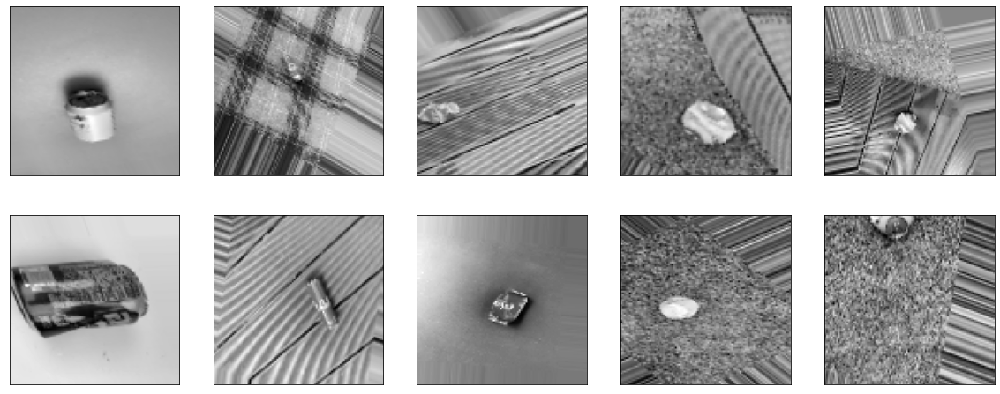

In [25]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break

In [26]:
modeloDenso_AD = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [27]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [28]:
len(X) * .85 
len(X) - 19700 

X_entrenamiento = X[:19700]
X_validacion = X[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [29]:
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')

modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]
)

In [31]:
tensorboardCNN_AD = TensorBoard(log_dir='logs-new/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=150, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
)

81/81 [==============================] - 3s 33ms/step - loss: 0.1189 - accuracy: 0.9552
Epoch 127/150
81/81 [==============================] - 3s 36ms/step - loss: 0.1427 - accuracy: 0.9431
Epoch 128/150
81/81 [==============================] - 3s 34ms/step - loss: 0.1392 - accuracy: 0.9451
Epoch 129/150
81/81 [==============================] - 3s 34ms/step - loss: 0.1244 - accuracy: 0.9533
Epoch 130/150
81/81 [==============================] - 3s 34ms/step - loss: 0.1212 - accuracy: 0.9560
Epoch 131/150
81/81 [==============================] - 3s 34ms/step - loss: 0.1263 - accuracy: 0.9486
Epoch 132/150
81/81 [==============================] - 3s 34ms/step - loss: 0.1255 - accuracy: 0.9505
Epoch 133/150
81/81 [==============================] - 3s 34ms/step - loss: 0.1409 - accuracy: 0.9455
Epoch 134/150
81/81 [==============================] - 3s 33ms/step - loss: 0.1136 - accuracy: 0.9525
Epoch 135/150
81/81 [==============================] - 3s 33ms/step - loss: 0.1386 - accuracy: 0

In [32]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)

Epoch 1/100
81/81 [==============================] - 3s 34ms/step - loss: 0.6863 - accuracy: 0.5915
Epoch 2/100
81/81 [==============================] - 3s 35ms/step - loss: 0.6141 - accuracy: 0.6826
Epoch 3/100
81/81 [==============================] - 3s 33ms/step - loss: 0.5968 - accuracy: 0.6916
Epoch 4/100
81/81 [==============================] - 3s 33ms/step - loss: 0.5767 - accuracy: 0.7114
Epoch 5/100
81/81 [==============================] - 3s 34ms/step - loss: 0.5780 - accuracy: 0.7064
Epoch 6/100
81/81 [==============================] - 3s 34ms/step - loss: 0.5785 - accuracy: 0.7130
Epoch 7/100
81/81 [==============================] - 3s 34ms/step - loss: 0.5673 - accuracy: 0.7208
Epoch 8/100
81/81 [==============================] - 3s 34ms/step - loss: 0.5644 - accuracy: 0.7220
Epoch 9/100
81/81 [==============================] - 3s 33ms/step - loss: 0.5455 - accuracy: 0.7286
Epoch 10/100
81/81 [==============================] - 3s 33ms/step - loss: 0.5405 - accuracy: 0.7321

Se preparan los modelos para exportarlos y visualizarlos en una página Html

In [33]:
modeloDenso.save('garbage-denso.h5')
modeloCNN.save('garbage-cnn.h5')
modeloCNN2.save('garbage-cnn2.h5')

modeloDenso_AD.save('garbage-denso-ad.h5')
modeloCNN_AD.save('garbage-cnn-ad.h5')
modeloCNN2_AD.save('garbage-cnn2-ad.h5')

In [34]:
!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 84 kB 3.0 MB/s 
     |████████████████████████████████| 189 kB 69.2 MB/s 
     |████████████████████████████████| 588.3 MB 6.6 kB/s 
     |████████████████████████████████| 16.2 MB 25.2 MB/s 
     |████████████████████████████████| 40 kB 3.4 MB/s 
     |████████████████████████████████| 154 kB 73.4 MB/s 
     |████████████████████████████████| 8.3 MB 57.0 MB/s 
     |████████████████████████████████| 237 kB 77.3 MB/s 
     |████████████████████████████████| 51 kB 7.4 MB/s 
     |████████████████████████████████| 6.0 MB 53.6 MB/s 
     |████████████████████████████████| 439 kB 77.2 MB/s 
     |████████████████████████████████| 1.7 MB 53.3 MB/s 
     |████████████████████████████████| 85 kB 4.7 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
   

In [35]:
!mkdir carpeta_salida

In [43]:
!tensorflowjs_converter --input_format keras garbage-denso.h5 carpeta_salidaDenso

2022-11-28 15:58:40.265677: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:58:40.265789: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:58:40.265808: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [44]:
!tensorflowjs_converter --input_format keras garbage-cnn.h5 carpeta_salidaCNN

2022-11-28 15:58:49.788763: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:58:49.788871: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:58:49.788890: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [45]:
!tensorflowjs_converter --input_format keras garbage-cnn2.h5 carpeta_salidaCNN2

2022-11-28 15:59:01.721464: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:01.721620: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:01.721651: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [46]:
!tensorflowjs_converter --input_format keras garbage-denso-ad.h5 carpeta_salidaDensoAD

2022-11-28 15:59:16.775781: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:16.775927: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:16.775949: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [47]:
!tensorflowjs_converter --input_format keras garbage-cnn-ad.h5 carpeta_salidaCNNAD

2022-11-28 15:59:25.755426: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:25.755559: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:25.755583: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [48]:
!tensorflowjs_converter --input_format keras garbage-cnn2-ad.h5 carpeta_salidaCNN2AD

2022-11-28 15:59:37.308081: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:37.308188: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.7/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2022-11-28 15:59:37.308208: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


In [42]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>